# Table of Contents
 <p><div class="lev1 toc-item"><a href="#Data-import-and-preprocessing" data-toc-modified-id="Data-import-and-preprocessing-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Data import and preprocessing</a></div><div class="lev1 toc-item"><a href="#Preparing-Test-Data" data-toc-modified-id="Preparing-Test-Data-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Preparing Test Data</a></div><div class="lev1 toc-item"><a href="#Kernel-Specification" data-toc-modified-id="Kernel-Specification-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Kernel Specification</a></div><div class="lev1 toc-item"><a href="#Fitting-GP-on-training-data" data-toc-modified-id="Fitting-GP-on-training-data-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Fitting GP on training data</a></div><div class="lev2 toc-item"><a href="#Predicting-at-the-test-location" data-toc-modified-id="Predicting-at-the-test-location-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>Predicting at the test location</a></div><div class="lev2 toc-item"><a href="#Prior-draws" data-toc-modified-id="Prior-draws-4.2"><span class="toc-item-num">4.2&nbsp;&nbsp;</span>Prior draws</a></div><div class="lev2 toc-item"><a href="#Predictive-draws" data-toc-modified-id="Predictive-draws-4.3"><span class="toc-item-num">4.3&nbsp;&nbsp;</span>Predictive draws</a></div><div class="lev1 toc-item"><a href="#STAN-imputations" data-toc-modified-id="STAN-imputations-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>STAN imputations</a></div><div class="lev2 toc-item"><a href="#Model-specification" data-toc-modified-id="Model-specification-5.1"><span class="toc-item-num">5.1&nbsp;&nbsp;</span>Model specification</a></div><div class="lev2 toc-item"><a href="#preparing-Stan-data" data-toc-modified-id="preparing-Stan-data-5.2"><span class="toc-item-num">5.2&nbsp;&nbsp;</span>preparing Stan data</a></div><div class="lev2 toc-item"><a href="#Plotting" data-toc-modified-id="Plotting-5.3"><span class="toc-item-num">5.3&nbsp;&nbsp;</span>Plotting</a></div><div class="lev1 toc-item"><a href="#Reparametrizing-STAN-model" data-toc-modified-id="Reparametrizing-STAN-model-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Reparametrizing STAN model</a></div>

$$
    \newcommand{\genericdel}[3]{%
      \left#1#3\right#2
    }
    \newcommand{\del}[1]{\genericdel(){#1}}
    \newcommand{\sbr}[1]{\genericdel[]{#1}}
    \newcommand{\cbr}[1]{\genericdel\{\}{#1}}
    \newcommand{\abs}[1]{\genericdel||{#1}}
    \DeclareMathOperator*{\argmin}{arg\,min}
    \DeclareMathOperator*{\argmax}{arg\,max}
    \DeclareMathOperator{\Pr}{\mathbb{p}}
    \DeclareMathOperator{\E}{\mathbb{E}}
    \DeclareMathOperator{\Ind}{\mathbb{I}}
    \DeclareMathOperator{\var}{var}
    \DeclareMathOperator{\cov}{cov}
    \DeclareMathOperator{\invchi}{\mathrm{Inv-\chi}^2}
    \DeclareMathOperator*{\argmin}{arg\,min}
    \DeclareMathOperator*{\argmax}{arg\,max}
    \newcommand{\effect}{\mathrm{eff}}
    \newcommand{\xtilde}{\widetilde{X}}
    \DeclareMathOperator{\normal}{\mathcal{N}}
    \DeclareMathOperator{\unif}{Uniform}
    \DeclareMathOperator{\GP}{\mathcal{GP}}
    \DeclareMathOperator{\l}{\mathscr{l}}
    \newcommand{\Tn}{\mathrm{T}_{n}}
    \newcommand{\Tx}{\mathrm{T}_{x}}
$$

Build the pipeline to get the data into STAN.

In [1]:
using Stan

using TimeSeries
using DataFrames
using GaussianProcesses
using GaussianProcesses: Mean, Kernel, evaluate, metric, IsotropicData, VecF64
using GaussianProcesses: Stationary, KernelData, MatF64, predict
import GaussianProcesses: optimize!, get_optim_target, cov, grad_slice!
import GaussianProcesses: num_params, set_params!, get_params, update_mll!, update_mll_and_dmll!
import GaussianProcesses: get_param_names, cov!, addcov!, multcov!
import Proj4
using Optim
using Distances
using DataFrames: by, head
using Dates: tonext, Hour, Day
;

In [2]:
import PyPlot; plt=PyPlot
using LaTeXStrings
plt.rc("figure", dpi=300.0)
plt.rc("figure", figsize=(12,8))
plt.rc("savefig", dpi=300.0)
plt.rc("text", usetex=true)
plt.rc("font", family="serif")
plt.rc("font", serif="Palatino")
;

# Data import and preprocessing

In [3]:
include("src/preprocessing.jl")
include("src/variogram.jl")
include("src/utils.jl")

measurement_date (generic function with 1 method)

In [4]:
isdList=read_isdList()
isdSubset=isdList[[(usaf in (725450,725460,725480,725485)) for usaf in isdList[:USAF].values],:]
isdSubset

,USAF,WBAN,NAME,CTRY,STATE,ICAO,LAT,LON,ELEV,BEGIN,END,X_PRJ,Y_PRJ
1,725450,14990,THE EASTERN IOWA AIRPORT,US,IA,KCID,41.883,-91.717,264.6,1973,2015,1.64799e6,1.0441e6
2,725460,14933,DES MOINES INTERNATIONAL AIRPORT,US,IA,KDSM,41.534,-93.653,291.7,1973,2015,1.48723e6,1.00379e6
3,725480,94910,WATERLOO MUNICIPAL AIRPORT,US,IA,KALO,42.554,-92.401,264.6,1960,2015,1.59025e6,1.11766e6
4,725485,14940,MASON CITY MUNICIPAL ARPT,US,IA,KMCW,43.154,-93.327,373.4,1973,2015,1.51407e6,1.18374e6


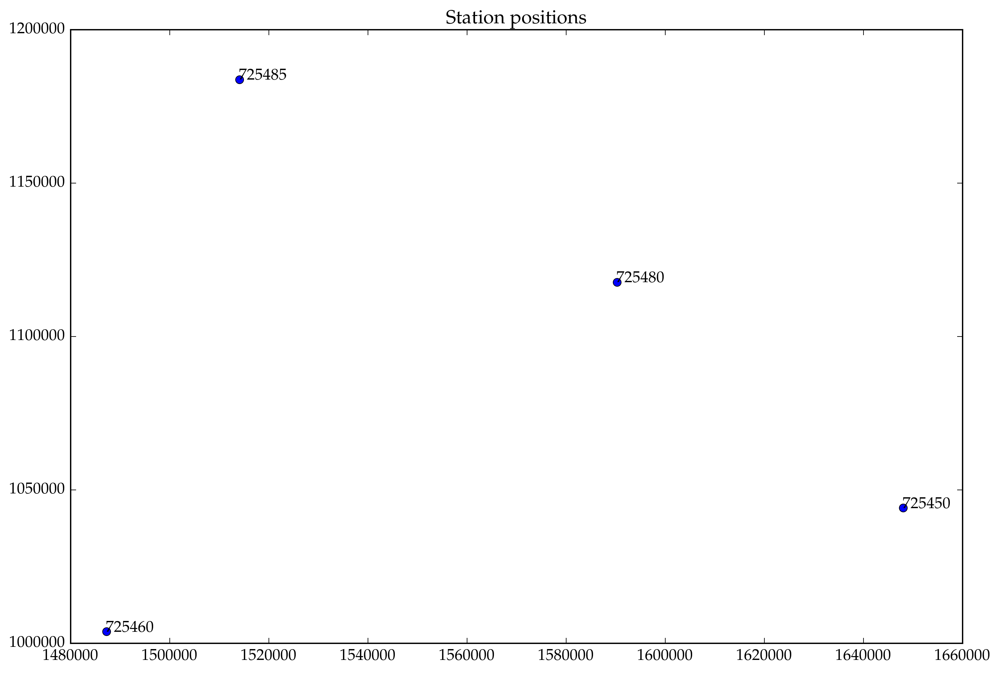

In [5]:
plt.plot(isdSubset[:X_PRJ].values, isdSubset[:Y_PRJ].values, "o")
for r in eachrow(isdSubset)
    plt.text(get(r[:X_PRJ]), get(r[:Y_PRJ]), get(r[:USAF]))
end
plt.title("Station positions")
;

In [6]:
hourly_cat=read_Stations(isdSubset)
itest=3
hourly_train = hourly_cat[hourly_cat[:station].values.!=itest,:]
hourly_test  = hourly_cat[hourly_cat[:station].values.==itest,:]
nrow(hourly_train), nrow(hourly_test)

(35169,12695)

# Preparing Test Data

In [7]:
hr_measure = Hour(17) # number between 0 and 24
hourly_test[:ts_day] = [measurement_date(t, hr_measure) for t in hourly_test[:ts].values]
TnTx = DataFrames.by(hourly_test, :ts_day, df -> DataFrame(
    Tn=minimum(df[:temp].values), 
    Tx=maximum(df[:temp].values)))
test_trimmed=join(hourly_test, TnTx, on=:ts_day)
head(test_trimmed)

,year,month,day,hour,min,seconds,temp,ts,station,ts_hours,ts_day,Tn,Tx
1,2015,1,1,0,0,0,-8.3,2015-01-01T00:00:00,3,0.0,2015-01-01,-11.1,-3.9
2,2015,1,1,0,54,0,-8.9,2015-01-01T00:54:00,3,0.9,2015-01-01,-11.1,-3.9
3,2015,1,1,1,54,0,-8.9,2015-01-01T01:54:00,3,1.9,2015-01-01,-11.1,-3.9
4,2015,1,1,2,54,0,-9.4,2015-01-01T02:54:00,3,2.9,2015-01-01,-11.1,-3.9
5,2015,1,1,3,54,0,-9.4,2015-01-01T03:54:00,3,3.9,2015-01-01,-11.1,-3.9
6,2015,1,1,4,54,0,-10.0,2015-01-01T04:54:00,3,4.9,2015-01-01,-11.1,-3.9


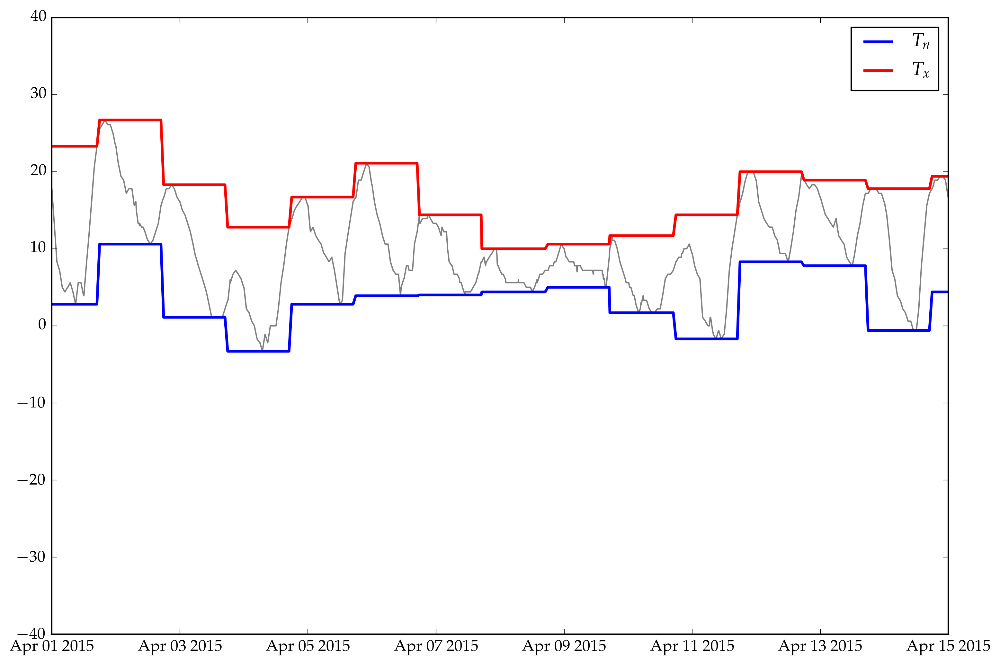

In [8]:
plt.plot(test_trimmed[:ts].values, test_trimmed[:temp].values, color="grey")
plt.plot(test_trimmed[:ts].values, test_trimmed[:Tn].values, color="blue", linewidth=2, label=L"$T_n$")
plt.plot(test_trimmed[:ts].values, test_trimmed[:Tx].values, color="red", linewidth=2, label=L"$T_x$")
plt.xlim(DateTime(2015,4,1),DateTime(2015,4,15)) # random interval
plt.legend()
;

# Kernel Specification

In [9]:
# Temporal
k1 = fix(Periodic(0.0,0.0,log(24.0)), :lp)
k2 = RQIso(0.0,0.0,0.0)
k3 = SEIso(0.0,0.0)
k4 = RQIso(0.0,0.0,0.0)
k5 = RQIso(0.0,0.0,0.0)
k6 = SEIso(0.0,0.0)
k_time=k1+k2+k3+k4+k5+k6
# hyperparameters fitted in JuliaGP_timeseries_chunks.ipynb
hyp=[-1.46229,-0.0777809,1.03854,1.45757,1.06292,-1.23699,-1.2353,-1.05117,3.10614,1.29327,2.84729,3.67464,0.537794,3.0094,7.70676,-5.30466]
set_params!(k_time, hyp[2:end])
ksp1 = SEIso(log(2*10^5), log(1.0))
ksp2 = SEIso(log(2*10^5), log(1.0))
ksp3 = SEIso(log(2*10^5), log(1.0))
ksp4 = SEIso(log(2*10^5), log(1.0))
ksp5 = SEIso(log(2*10^5), log(1.0))
ksp6 = SEIso(log(2*10^5), log(1.0))
k_means = SEIso(log(10^4), log(10.0))
k_spatiotemporal = fix(Masked(k1, [1])) * fix(Masked(ksp1, [2,3]), :lσ) +
                     fix(Masked(k2, [1])) * fix(Masked(ksp2, [2,3]), :lσ) +
                     fix(Masked(k3, [1])) * fix(Masked(ksp3, [2,3]), :lσ) +
                     fix(Masked(k4, [1])) * fix(Masked(ksp4, [2,3]), :lσ) +
                     fix(Masked(k5, [1])) * fix(Masked(ksp5, [2,3]), :lσ) +
                     fix(Masked(k6, [1])) * fix(Masked(ksp6, [2,3]), :lσ) +
                     fix(Masked(k_means, [2,3]))
hyp = [-1.59982,14.9184,9.8588,10.6024,15.1699,13.6829,12.2061]
set_params!(k_spatiotemporal, hyp[2:end])
logNoise=hyp[1]

-1.59982

In [10]:
print("k₁: Periodic \n=================\n")
@printf("σ: %5.3f\n", √k1.kern.σ2)
@printf("l: %5.3f\n", √k1.kern.ℓ2)
@printf("p: %5.0f hours\n", k1.kern.p)
print("> spatial decay:\n")
@printf("l: %5.3f\n", √ksp1.ℓ2)
print("\nk₂: RQIso \n=================\n")
@printf("σ: %5.3f\n", √ k2.σ2)
@printf("l: %5.3f hours\n", √ k2.ℓ2)
@printf("α: %5.3f\n", k2.α)
print("> spatial decay:\n")
# @printf("σ: %5.3f\n", √ksp2.σ2)
@printf("l: %5.3f\n", √ksp2.ℓ2)
print("\nk₃: SEIso \n=================\n")
@printf("σ: %5.3f\n", √k3.σ2)
@printf("l: %5.3f hours\n", √k3.ℓ2)
print("> spatial decay:\n")
# @printf("σ: %5.3f\n", √ksp3.σ2)
@printf("l: %5.3f\n", √ksp3.ℓ2)
print("\nk₄: RQIso \n=================\n")
@printf("σ: %5.3f\n", √k4.σ2)
@printf("l: %5.3f days\n", √k4.ℓ2 / 24)
@printf("α: %5.3f\n",  k4.α)
print("> spatial decay:\n")
# @printf("σ: %5.3f\n", √ksp4.σ2)
@printf("l: %5.3f\n", √ksp4.ℓ2)
print("\nk₅: RQIso \n=================\n")
@printf("σ: %5.3f\n", √k5.σ2)
@printf("l: %5.3f days\n", √k5.ℓ2 / 24)
@printf("α: %5.3f\n",  k5.α)
print("> spatial decay:\n")
# @printf("σ: %5.3f\n", √ksp5.σ2)
@printf("l: %5.3f\n", √ksp5.ℓ2)
print("\nk₆ SEIso \n=================\n")
@printf("σ: %5.3f\n", √k6.σ2)
@printf("l: %5.3f days\n", √k6.ℓ2 / 24)
print("> spatial decay:\n")
# @printf("σ: %5.3f\n", √ksp6.σ2)
@printf("l: %5.3f\n", √ksp6.ℓ2)
print("\n=================\n")
@printf("σy: %5.3f\n", exp(logNoise))

k₁: Periodic 
σ: 2.825
l: 0.925
p:    24 hours
> spatial decay:
l: 3012858.940

k₂: RQIso 
σ: 2.895
l: 4.296 hours
α: 0.290
> spatial decay:
l: 19125.925

k₃: SEIso 
σ: 0.350
l: 0.291 hours
> spatial decay:
l: 40231.277

k₄: RQIso 
σ: 3.645
l: 0.931 days
α: 17.241
> spatial decay:
l: 3874394.692

k₅: RQIso 
σ: 1.712
l: 1.643 days
α: 20.275
> spatial decay:
l: 875806.101

k₆ SEIso 
σ: 0.005
l: 92.639 days
> spatial decay:
l: 200005.471

σy: 0.202


# Fitting GP on training data

In [11]:
function subset(df, from, to)
    after_from = df[:ts].values .>= from
    before_to = df[:ts].values .<= to
    return df[after_from & before_to,:]
end

train_subset = subset(hourly_train,DateTime(2015,5,25,18,0,0), DateTime(2015,6,3,16,0,0))
avgtemp=by(train_subset, :station, df->DataFrame(avgtemp=mean(df[:temp].values)))
train_subset = join(train_subset, avgtemp, on=:station)

train_X_PRJ = isdSubset[:X_PRJ].values[train_subset[:station].values]
train_Y_PRJ = isdSubset[:Y_PRJ].values[train_subset[:station].values]
train_X = [train_subset[:ts_hours].values train_X_PRJ train_Y_PRJ]
train_Y = train_subset[:temp].values .- train_subset[:avgtemp].values

test_subset = subset(test_trimmed,DateTime(2015,5,25,18,0,0), DateTime(2015,6,3,16,0,0))
test_X_PRJ = isdSubset[:X_PRJ].values[test_subset[:station].values]
test_Y_PRJ = isdSubset[:Y_PRJ].values[test_subset[:station].values]
test_X = [test_subset[:ts_hours].values test_X_PRJ test_Y_PRJ]
;

In [12]:
train_GP = GP(train_X', train_Y, MeanZero(), k_spatiotemporal, logNoise);

In [13]:
prior_GP = GP(zeros(3,0), zeros(0), MeanZero(), k_spatiotemporal, logNoise);

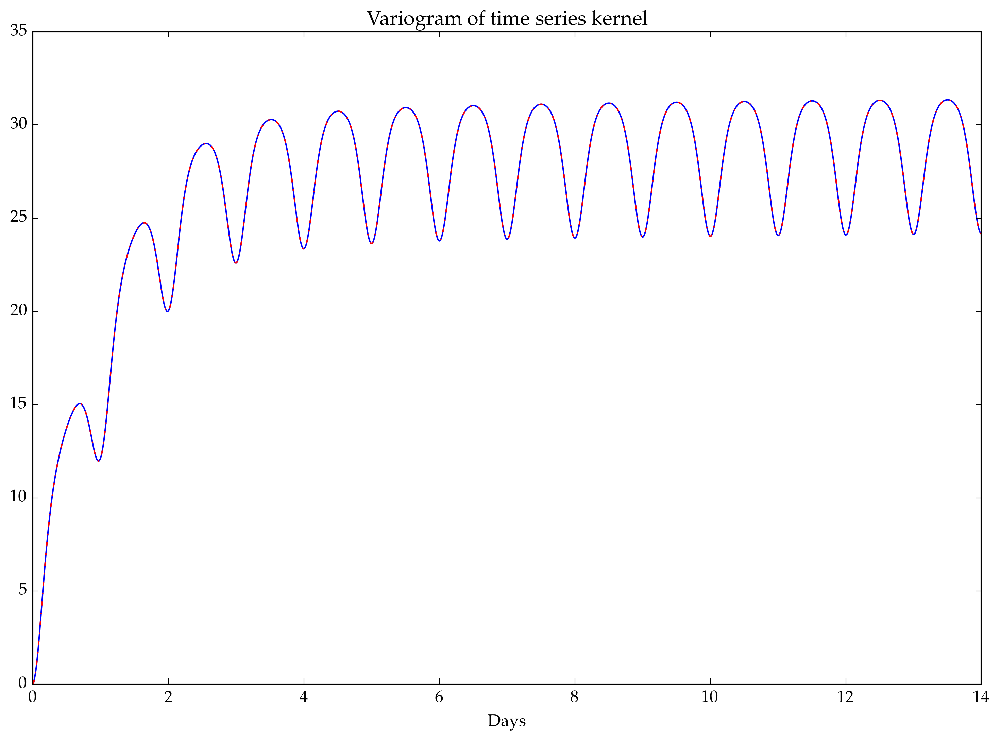

In [14]:
begin
    rr = linspace(0.0, 24*14, 1000)
    ck_r = [cov(k_time, [r], [0.0]) for r in rr]
    ck_r_2 = [cov(k_spatiotemporal, [r,0.0,0.0], [0.0,0.0,0.0]) for r in rr]
    plt.plot(rr/24, ck_r[1]-ck_r)
    plt.plot(rr/24, ck_r_2[1]-ck_r_2, linestyle="-.", color="red")
    plt.xlabel("Days")
    plt.title("Variogram of time series kernel")
end
;

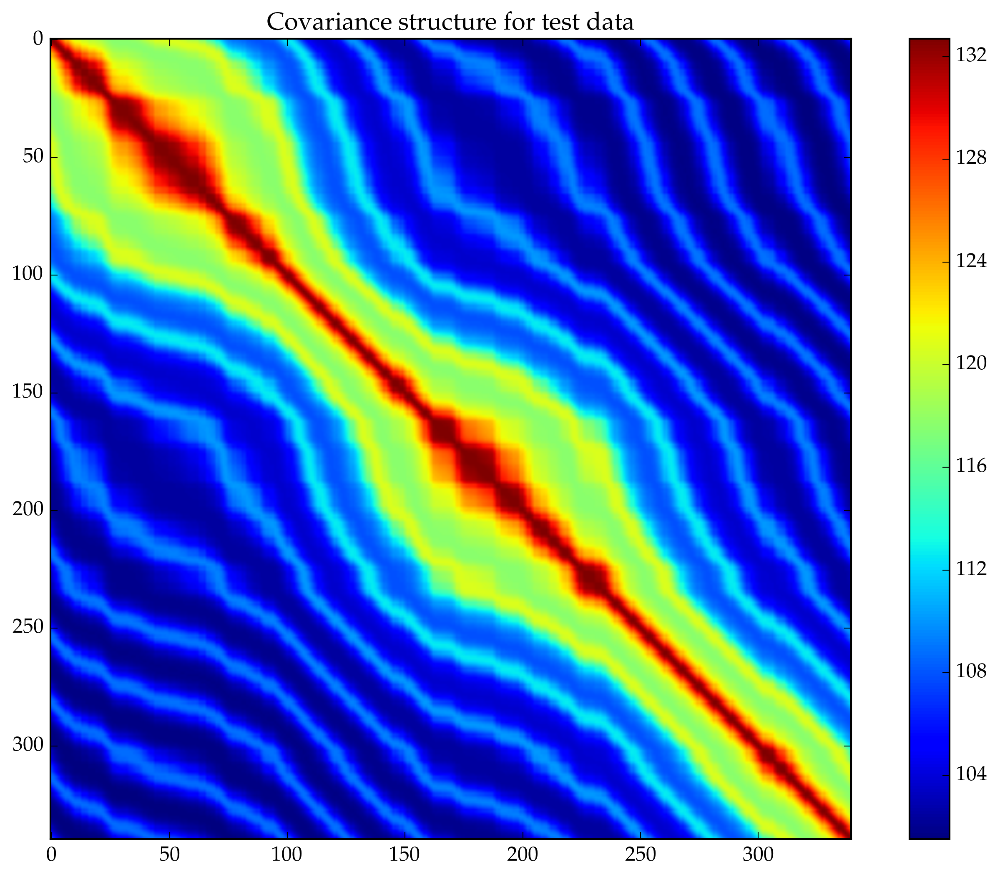

PyObject <matplotlib.colorbar.Colorbar object at 0x318be3c90>

In [15]:
plt.imshow(cov(k_spatiotemporal, test_X'))
plt.title("Covariance structure for test data")
plt.colorbar()

## Predicting at the test location

In [16]:
function add_diag!(Σ::PDMats.PDMat, a::Float64)
    mat = Σ.mat
    for i in 1:size(mat,1)
        mat[i,i] += a
    end
    copy!(Σ.chol.factors, mat)
    cholfact!(Σ.chol.factors, Symbol(Σ.chol.uplo))
    @assert sumabs(mat .- full(Σ.chol)) < 1e-8
    return Σ
end
;

  likely near /Users/imolk/.julia/v0.5/IJulia/src/kernel.jl:31
  likely near /Users/imolk/.julia/v0.5/IJulia/src/kernel.jl:31
  likely near /Users/imolk/.julia/v0.5/IJulia/src/kernel.jl:31
  likely near /Users/imolk/.julia/v0.5/IJulia/src/kernel.jl:31
  likely near /Users/imolk/.julia/v0.5/IJulia/src/kernel.jl:31
  likely near /Users/imolk/.julia/v0.5/IJulia/src/kernel.jl:31
  likely near /Users/imolk/.julia/v0.5/IJulia/src/kernel.jl:31
  likely near /Users/imolk/.julia/v0.5/IJulia/src/kernel.jl:31
  likely near /Users/imolk/.julia/v0.5/IJulia/src/kernel.jl:31
  likely near /Users/imolk/.julia/v0.5/IJulia/src/kernel.jl:31
  likely near /Users/imolk/.julia/v0.5/IJulia/src/kernel.jl:31
  likely near /Users/imolk/.julia/v0.5/IJulia/src/kernel.jl:31
  likely near /Users/imolk/.julia/v0.5/IJulia/src/kernel.jl:31
in show at /Users/imolk/.julia/v0.5/PyCall/src/PyCall.jl
  likely near /Users/imolk/.julia/v0.5/IJulia/src/kernel.jl:31
in show at /Users/imolk/.julia/v0.5/PyCall/src/PyCall.jl
  li

In [17]:
test_prediction=predict(train_GP, test_X'; full_cov=true)
prior_prediction=predict(prior_GP, test_X'; full_cov=true)
add_diag!(test_prediction[2], exp(2*logNoise))
add_diag!(prior_prediction[2], exp(2*logNoise))
;

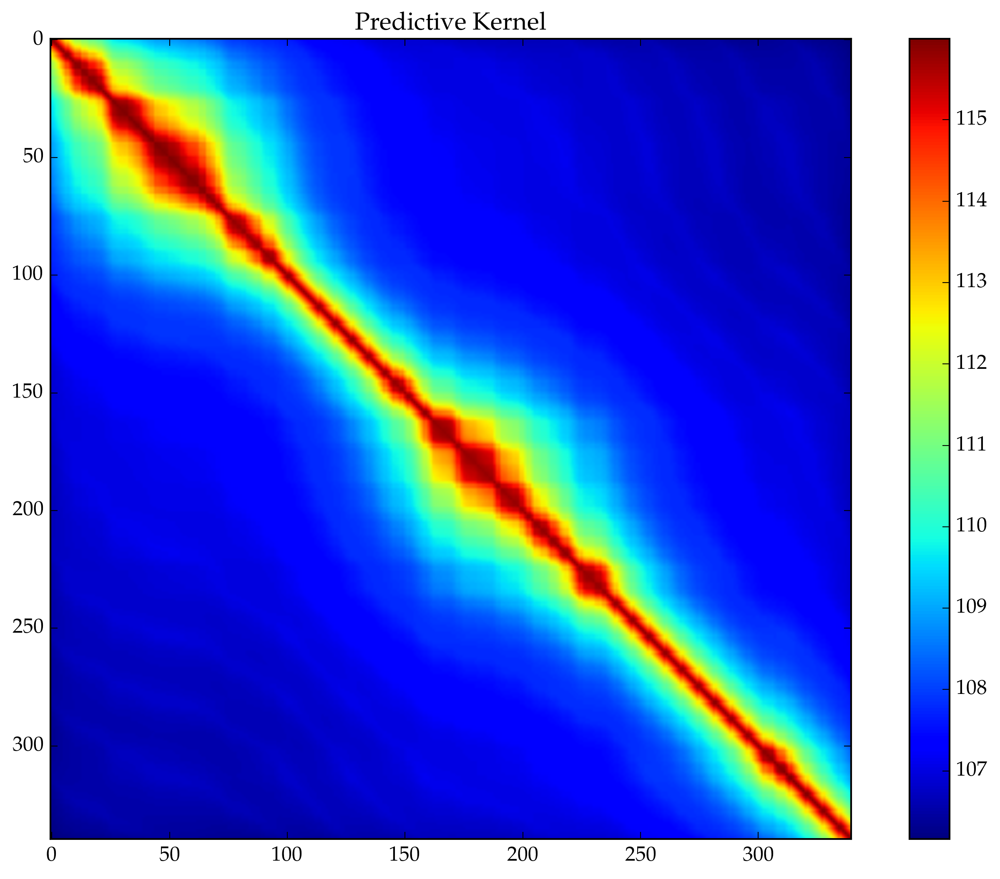

PyObject <matplotlib.colorbar.Colorbar object at 0x31ab633d0>

In [18]:
begin
    plt.imshow(test_prediction[2].mat)
    plt.title("Predictive Kernel")
    plt.colorbar()
end

## Prior draws

Let's look at a few draws from the prior, just to check that the time series kernel is reasonable.

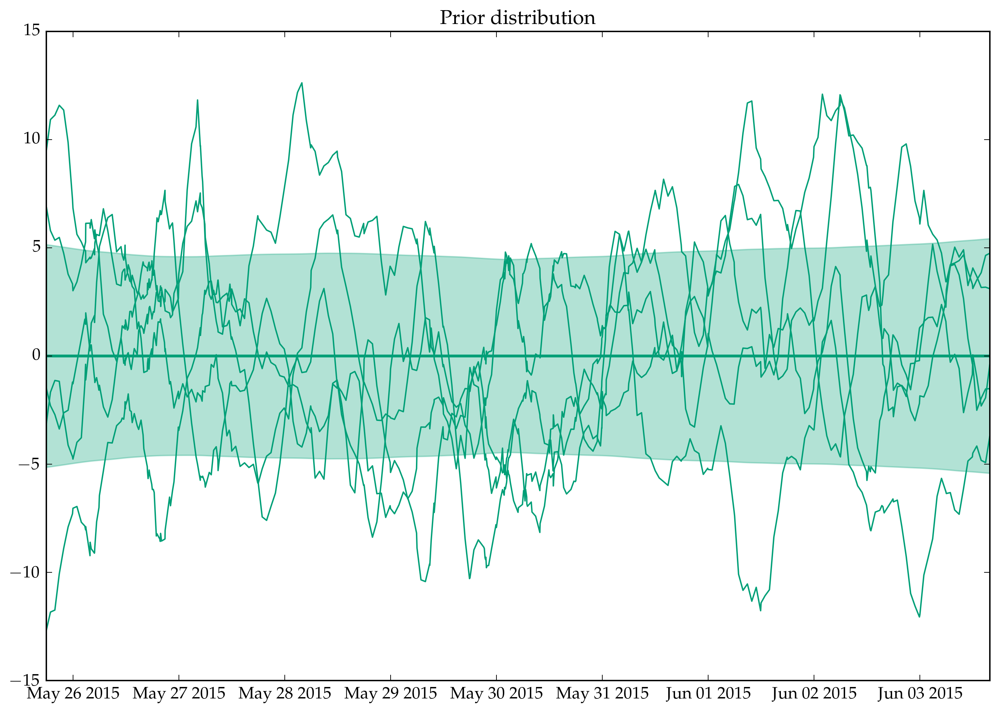

In [19]:
begin
    ts=test_subset[:ts].values
    μ = prior_prediction[1]
    Σ = prior_prediction[2]
    
    nobsv = length(μ)
    centering = eye(nobsv) .- (1.0/nobsv) .* ones(nobsv, nobsv)
    Σ_centered = centering * Σ.mat * centering

    distr = MultivariateNormal(μ, Σ)
    plt.plot(ts, μ, color="#009F77", linewidth=2, label="prior mean")
    for _ in 1:5
        temp_sim = rand(distr)
        plt.plot(ts, temp_sim.-mean(temp_sim), color="#009F77", linewidth=1)
    end
    plt.fill_between(ts, μ-√diag(Σ_centered),μ+√diag(Σ_centered), color="#009F77", alpha=0.3)

    plt.title("Prior distribution")
end
;

## Predictive draws

Let's show some draws from the posterior fitted using the hourly data at nearby stations, but *not* the $T_n$ and $T_x$ records.

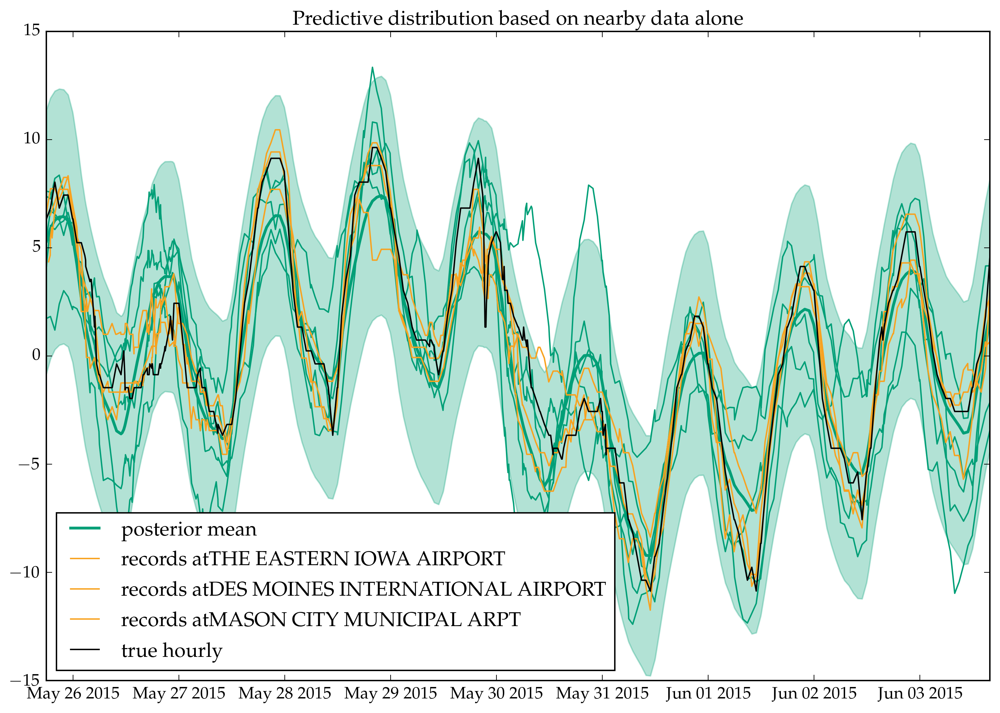

In [20]:
begin
    ts=test_subset[:ts].values
    μ = test_prediction[1]
    Σ = test_prediction[2]
    nobsv = length(μ)
    
    centering = eye(nobsv) .- (1.0/nobsv) .* ones(nobsv, nobsv)
    Σ_centered = centering * Σ.mat * centering
    distr = MultivariateNormal(μ, Σ)
    plt.plot(ts, μ, color="#009F77", linewidth=2, label="posterior mean")
    for _ in 1:5
        temp_sim = rand(distr)
        plt.plot(ts, temp_sim.-mean(temp_sim), color="#009F77", linewidth=1)
    end
    plt.fill_between(ts, μ-2*√diag(Σ_centered),μ+2*√diag(Σ_centered), color="#009F77", alpha=0.3)
    for station in unique(train_subset[:station].values)
        sdata = train_subset[train_subset[:station].values.==station,:]
        ts=sdata[:ts].values
        plt.plot(ts, sdata[:temp].values.-mean(sdata[:temp].values), color="#F8A21F", 
            label="records at"get(isdSubset[station,:NAME]))
    end
    ts = test_subset[:ts].values
    temp_true = test_subset[:temp].values
    plt.plot(ts, temp_true.-mean(temp_true), 
        color="black", "-", label="true hourly")
    plt.legend(loc="best")
    plt.title("Predictive distribution based on nearby data alone")
end
;

In [21]:
begin
    ts=test_subset[:ts].values
    μ = test_prediction[1]
    Σ = test_prediction[2]
    nobsv = length(μ)
    
    centering = eye(nobsv) .- (1.0/nobsv) .* ones(nobsv, nobsv)
    Σ_centered = centering * Σ.mat * centering
    distr = MultivariateNormal(μ, Σ)
#     println("sum(Σ_centered)=", sum(Σ_centered*Σ_centered))
    for _ in 1:5
        temp_sim = rand(distr)
        println("var(predicted mean - simulated prediction)=", var(μ .- temp_sim))
    end
    temp_true = test_subset[:temp].values
    println("E(var(predict-simulate))=", mean(var(μ .- rand(distr)) for _ in 1:2000))
    println("var(true-predicted mean)=", var(μ .- temp_true))
end
;

var(predicted mean - simulated prediction)=10.131214743572668
var(predicted mean - simulated prediction)=7.917453385240099
var(predicted mean - simulated prediction)=6.912644222513146
var(predicted mean - simulated prediction)=4.942356292207907
var(predicted mean - simulated prediction)=3.1182001818039073
E(var(predict-simulate))=7.618572301704348
var(true-predicted mean)=3.812619923096165


# STAN imputations

## Model specification

In [22]:
imputation_model = """
functions {
    real softmax(vector x, real k){
        real max10x;
        max10x = max(k*x);
        return (max10x+log(sum(exp(k*x - max10x))))/k;
    }
    real softmin(vector x, real k){
        return -softmax(-x, k);
    }
}
data {
    // Tn Tx data
    int<lower=1> N_TxTn; //
    vector[N_TxTn] Tx;
    vector[N_TxTn] Tn;
    
    // imputation points (for which we have )
    int<lower=1> Nimpt;
    int<lower=1,upper=N_TxTn> day_impute[Nimpt];
    // number of hours recorded within each day
    int<lower=1> impt_times_p_day[N_TxTn];
    
    // prior 
    vector[Nimpt] predicted_mean;
    matrix[Nimpt,Nimpt] predicted_cov;
    matrix[Nimpt,Nimpt] predicted_cov_chol;
    
    // control soft max hardness
    real<lower=0> k_softmax;
}
parameters {
    vector[Nimpt] temp_impt;
    real mu;
}
transformed parameters {
    real Tsoftmax[N_TxTn];
    real Tsoftmin[N_TxTn];  
    {
        int istart;
        istart = 1;
        for (i in 1:N_TxTn){
            int ntimes;
            ntimes = impt_times_p_day[i];
            Tsoftmin[i] = softmin(segment(temp_impt,istart,ntimes)+mu, k_softmax);
            Tsoftmax[i] = softmax(segment(temp_impt,istart,ntimes)+mu, k_softmax);
            istart = istart + ntimes;
        }
    }
}
model {
    // temp_impt ~ multi_normal(predicted_mean, predicted_cov);
    mu ~ normal(0, 100.0);
    temp_impt ~ multi_normal_cholesky(predicted_mean, predicted_cov_chol);
    Tn ~ normal(Tsoftmin, 0.1);
    Tx ~ normal(Tsoftmax, 0.1);
}
"""
;

## preparing Stan data

In [23]:
test_TxTn = by(test_subset, :ts_day, df -> DataFrame(
    Tn=first(df[:Tn]), 
    Tx=first(df[:Tx]), 
    times_p_day=nrow(df),
))

,ts_day,Tn,Tx,times_p_day
1,2015-05-26,15.6,25.6,46
2,2015-05-27,13.9,22.8,54
3,2015-05-28,13.9,26.7,27
4,2015-05-29,16.7,27.2,31
5,2015-05-30,12.8,26.7,59
6,2015-05-31,6.7,16.1,36
7,2015-06-01,6.7,19.4,28
8,2015-06-02,10.0,21.7,32
9,2015-06-03,15.0,23.9,27


In [24]:
ts_day = test_subset[:ts_day].values
day_impute = convert(Vector{Int}, ts_day .- minimum(ts_day))+1
imputation_data = Dict(
    "N_TxTn" => nrow(test_TxTn),
    "Tn" => test_TxTn[:Tn].values,
    "Tx" => test_TxTn[:Tx].values,
    "Nimpt" => nrow(test_subset),
    "day_impute" => day_impute,
    "impt_times_p_day" => test_TxTn[:times_p_day].values,
    "predicted_mean" => test_prediction[1],
    "predicted_cov" => test_prediction[2].mat,
    "predicted_cov_chol" => full(test_prediction[2].chol[:L]),
    "k_softmax" => 10.0,
    
)

Dict{String,Any} with 10 entries:
  "Tx"                 => [25.6,22.8,26.7,27.2,26.7,16.1,19.4,21.7,23.9]
  "predicted_cov_chol" => [10.7702 0.0 … 0.0 0.0; 10.7355 0.835136 … 0.0 0.0; ……
  "impt_times_p_day"   => [46,54,27,31,59,36,28,32,27]
  "Nimpt"              => 340
  "Tn"                 => [15.6,13.9,13.9,16.7,12.8,6.7,6.7,10.0,15.0]
  "N_TxTn"             => 9
  "day_impute"         => [1,1,1,1,1,1,1,1,1,1  …  9,9,9,9,9,9,9,9,9,9]
  "predicted_cov"      => [115.997 115.624 … 106.182 106.165; 115.624 115.949 ……
  "predicted_mean"     => [5.28694,5.89122,6.2684,6.41876,6.43462,6.24386,5.504…
  "k_softmax"          => 10.0

In [25]:
nchains=4
stanmodel = Stanmodel(name="imputation", model=imputation_model, nchains=nchains, adapt=1000, update=1000)

  name =                    "imputation"
  nchains =                 4
  update =                   1000
  adapt =                    1000
  thin =                     1
  monitors =                String[]
  model_file =              "imputation.stan"
  data_file =                ""
  output =                  Output()
    file =                    ""
    diagnostics_file =        ""
    refresh =                 100
  method =                  Sample()
    num_samples =             1000
    num_warmup =              1000
    save_warmup =             false
    thin =                    1
    algorithm =               HMC()
      engine =                  NUTS()
        max_depth =               10
      metric =                  

In [26]:
@time sim1 = stan(stanmodel, [imputation_data], CmdStanDir=Stan.CMDSTAN_HOME, );

Stan.diag_e
      stepsize =                1.0
      stepsize_jitter =         1.0
    adapt =                   Adapt()
      gamma =                   0.05
      delta =                   0.8
      kappa =                   0.75
      t0 =                      10.0
      init_buffer =             75
      term_buffer =             50
      window =                  25

make: `/Users/imolk/Documents/Harvard/Natesh/temperature_model/tmp/imputation' is up to date.

Length of data array is not equal to nchains,
all chains will use the first data dictionary.

Inference for Stan model: imputation_model
4 chains: each with iter=(1000,1000,1000,1000); warmup=(0,0,0,0); thin=(1,1,1,1); 4000 iterations saved.

Warmup took (1752, 1673, 1797, 1678) seconds, 1.9 hours total
Sampling took (1876, 2092, 2200, 2375) seconds, 2.4 hours total

                     Mean     MCSE   StdDev        5%       50%       95%  N_Eff  N_Eff/s    R_hat
lp__             -1.8e+02  3.5e-01  1.3e+01  -2.0e+02  -1.8e+

In [27]:
# convenience function to extract the imputed temperatures
# from the STAN model object
temp_varnames=[@sprintf("temp_impt.%d", i) for i in 1:imputation_data["Nimpt"]]

function get_temperatures(sim::Mamba.Chains)
    nsamples = size(sim,1)
    mu_samples=getindex(sim, :, "mu", :).value
    temp_samples=getindex(sim, :, temp_varnames, :).value
    temp_impute=broadcast(+, mu_samples, temp_samples)
    return temp_impute
end

temp_impute = get_temperatures(sim1);

## Plotting

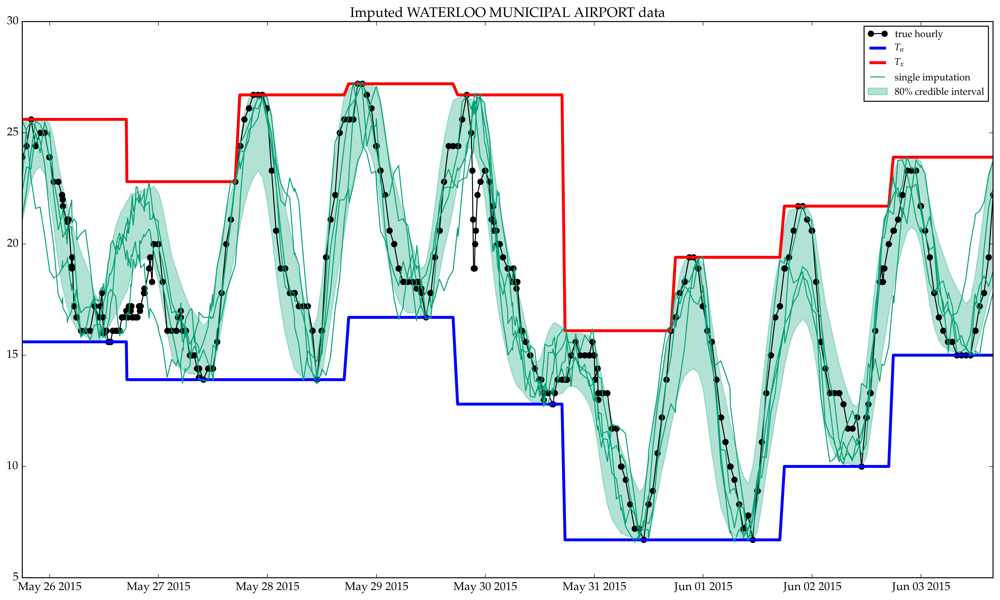

In [28]:
begin;
    temp_impute = get_temperatures(sim1)
    stacked_impute=vcat((temp_impute[:,:,i] for i in 1:size(temp_impute,3))...)
    sorted_impute = sort(stacked_impute,1);
    nsamples=size(sorted_impute,1)
    # extract and 2.5th and 97.5th percentiles
    # of the imputations
    imputed_10 = sorted_impute[div(nsamples,10), :]
    imputed_90 = sorted_impute[nsamples-div(nsamples,10), :]
    ts = test_subset[:ts].values
    plt.plot(ts, test_subset[:temp].values, 
        color="black", "o-", label="true hourly")
    plt.plot(ts, test_subset[:Tn].values, 
        color="blue", linewidth=3, label=L"$T_n$")
    plt.plot(ts, test_subset[:Tx].values, 
        color="red", linewidth=3, label=L"$T_x$")
    plt.fill_between(ts, imputed_10, imputed_90, 
        color="#009F77", alpha=0.3, label=L"$80\%$ credible interval")
    plt.plot(ts, temp_impute[250,:,1],
        color="#009F77", label="single imputation")
    for i in 2:size(temp_impute,3)
        plt.plot(ts, temp_impute[250,:,i], color="#009F77")
    end
    plt.legend(loc="best", fontsize="small")
    plt.gcf()[:set_size_inches](18.0, 10.0)
    plt.title(@sprintf("Imputed %s data", get(isdSubset[itest,:NAME])))
end;

This is looking better: the credible intervals have tightened, 
as our imputations are able to draw more information from nearby
stations.

# Reparametrizing STAN model

Stan is slow and our effective sample size is low. What can we do? Let's try reparametrizing.

In [29]:
reparam_model_str = """
functions {
    real softmax(vector x, real k){
        real max10x;
        max10x = max(k*x);
        return (max10x+log(sum(exp(k*x - max10x))))/k;
    }
    real softmin(vector x, real k){
        return -softmax(-x, k);
    }
}
data {
    // Tn Tx data
    int<lower=1> N_TxTn; //
    vector[N_TxTn] Tx;
    vector[N_TxTn] Tn;
    
    // imputation points (for which we have )
    int<lower=1> Nimpt;
    int<lower=1,upper=N_TxTn> day_impute[Nimpt];
    // number of hours recorded within each day
    int<lower=1> impt_times_p_day[N_TxTn];
    
    // prior 
    vector[Nimpt] predicted_mean;
    matrix[Nimpt,Nimpt] predicted_cov;
    matrix[Nimpt,Nimpt] predicted_cov_chol;
    
    // control soft max hardness
    real<lower=0> k_softmax;
}
parameters {
    vector[Nimpt] w_uncorr;
    real mu;
}
transformed parameters {
    vector[Nimpt] temp_impt;
    real Tsoftmax[N_TxTn];
    real Tsoftmin[N_TxTn];  
    temp_impt = mu + predicted_mean + predicted_cov_chol*w_uncorr;
    {
        int istart;
        istart = 1;
        for (i in 1:N_TxTn){
            int ntimes;
            ntimes = impt_times_p_day[i];
            Tsoftmin[i] = softmin(segment(temp_impt,istart,ntimes), k_softmax);
            Tsoftmax[i] = softmax(segment(temp_impt,istart,ntimes), k_softmax);
            istart = istart + ntimes;
        }
    }
}
model {
    w_uncorr ~ normal(0,1);
    mu ~ normal(0, 100.0);
    Tn ~ normal(Tsoftmin, 0.1);
    Tx ~ normal(Tsoftmax, 0.1);
}
"""
;

In [30]:
nchains=4
reparam_model = Stanmodel(name="reparam", model=reparam_model_str, 
    nchains=nchains, 
    adapt=1000, 
    update=1000)

In [31]:
@time sim2 = stan(reparam_model, [imputation_data], CmdStanDir=Stan.CMDSTAN_HOME, summary=false);

  name =                    "reparam"
  nchains =                 4
  update =                   1000
  adapt =                    1000
  thin =                     1
  monitors =                String[]
  model_file =              "reparam.stan"
  data_file =                ""
  output =                  Output()
    file =                    ""
    diagnostics_file =        ""
    refresh =                 100
  method =                  Sample()
    num_samples =             1000
    num_warmup =              1000
    save_warmup =             false
    thin =                    1
    algorithm =               HMC()
      engine =                  NUTS()
        max_depth =               10
      metric =                  Stan.diag_e
      stepsize =                1.0
      stepsize_jitter =         1.0
    adapt =                   Adapt()
      gamma =                   0.05
      delta =                   0.8
      kappa =                   0.75
      t0 =                      1

In [32]:
function get_temperatures_reparam(sim::Mamba.Chains)
    temp_samples=getindex(sim, :, temp_varnames, :).value
    return temp_samples
end

get_temperatures_reparam (generic function with 1 method)

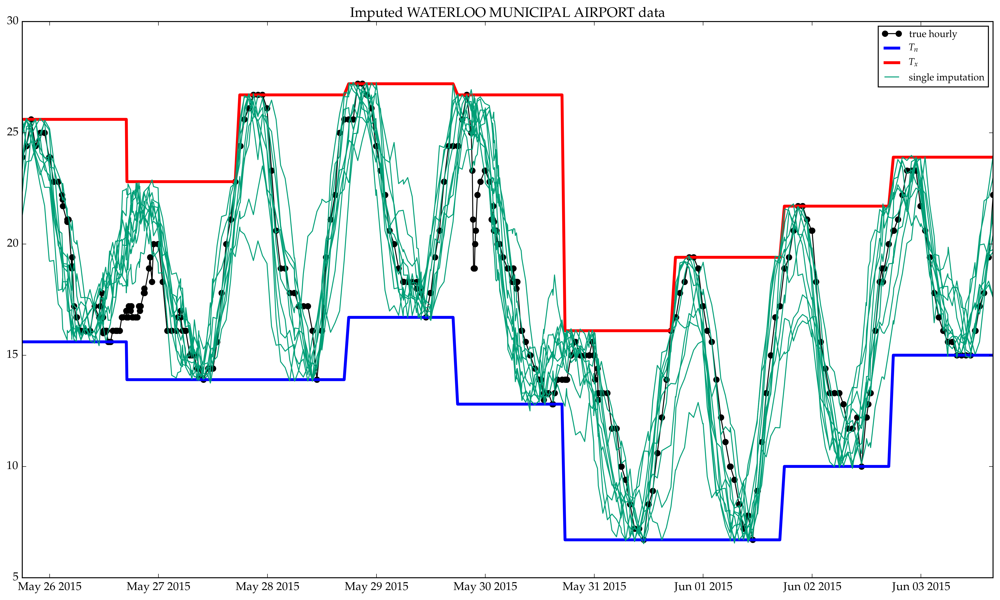

In [33]:
begin;
    temp_impute = get_temperatures_reparam(sim2)
    stacked_impute=vcat((temp_impute[:,:,i] for i in 1:size(temp_impute,3))...)
    sorted_impute = sort(stacked_impute,1);
    nsamples=size(sorted_impute,1)
    # extract and 2.5th and 97.5th percentiles
    # of the imputations
    imputed_10 = sorted_impute[div(nsamples,10), :]
    imputed_90 = sorted_impute[nsamples-div(nsamples,10), :]
    ts = test_subset[:ts].values
    plt.plot(ts, test_subset[:temp].values, 
        color="black", "o-", label="true hourly")
    plt.plot(ts, test_subset[:Tn].values, 
        color="blue", linewidth=3, label=L"$T_n$")
    plt.plot(ts, test_subset[:Tx].values, 
        color="red", linewidth=3, label=L"$T_x$")
#     plt.fill_between(ts, imputed_10, imputed_90, 
#         color="#009F77", alpha=0.3, label=L"$80\%$ credible interval")
    plt.plot(ts, temp_impute[250,:,1],
        color="#009F77", label="single imputation")
    for i in 2:size(temp_impute,3)
        plt.plot(ts, temp_impute[250,:,i], color="#009F77")
    end
    for i in 2:size(temp_impute,3)
        plt.plot(ts, temp_impute[500,:,i], color="#009F77")
    end
    for i in 2:size(temp_impute,3)
        plt.plot(ts, temp_impute[750,:,i], color="#009F77")
    end
    plt.legend(loc="best", fontsize="small")
    plt.gcf()[:set_size_inches](18.0, 10.0)
    plt.title(@sprintf("Imputed %s data", get(isdSubset[itest,:NAME])))
end;

# Table of Contents
 <p><div class="lev1 toc-item"><a href="#Data-import-and-preprocessing" data-toc-modified-id="Data-import-and-preprocessing-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Data import and preprocessing</a></div><div class="lev1 toc-item"><a href="#Preparing-Test-Data" data-toc-modified-id="Preparing-Test-Data-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Preparing Test Data</a></div><div class="lev1 toc-item"><a href="#Kernel-Specification" data-toc-modified-id="Kernel-Specification-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Kernel Specification</a></div><div class="lev1 toc-item"><a href="#Fitting-GP-on-training-data" data-toc-modified-id="Fitting-GP-on-training-data-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Fitting GP on training data</a></div><div class="lev2 toc-item"><a href="#Predicting-at-the-test-location" data-toc-modified-id="Predicting-at-the-test-location-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>Predicting at the test location</a></div><div class="lev2 toc-item"><a href="#Prior-draws" data-toc-modified-id="Prior-draws-4.2"><span class="toc-item-num">4.2&nbsp;&nbsp;</span>Prior draws</a></div><div class="lev2 toc-item"><a href="#Predictive-draws" data-toc-modified-id="Predictive-draws-4.3"><span class="toc-item-num">4.3&nbsp;&nbsp;</span>Predictive draws</a></div><div class="lev1 toc-item"><a href="#STAN-imputations" data-toc-modified-id="STAN-imputations-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>STAN imputations</a></div><div class="lev2 toc-item"><a href="#Model-specification" data-toc-modified-id="Model-specification-5.1"><span class="toc-item-num">5.1&nbsp;&nbsp;</span>Model specification</a></div><div class="lev2 toc-item"><a href="#preparing-Stan-data" data-toc-modified-id="preparing-Stan-data-5.2"><span class="toc-item-num">5.2&nbsp;&nbsp;</span>preparing Stan data</a></div><div class="lev2 toc-item"><a href="#Plotting" data-toc-modified-id="Plotting-5.3"><span class="toc-item-num">5.3&nbsp;&nbsp;</span>Plotting</a></div><div class="lev1 toc-item"><a href="#Reparametrizing-STAN-model" data-toc-modified-id="Reparametrizing-STAN-model-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Reparametrizing STAN model</a></div>